# Inlämningsuppgift: Del 2 - Adversarial input attack

Tobias Mattsson \
tomt21@student.bth.se

Samuel Nyberg \
sany21@student.bth.se

Enviroment för denna Jupyter Notebook var Tensorflow v2.10 samt numpy v1.24.0

## Nedan följer kod för att läsa in bilderna och klassificera dem med ResNet50 modellen

In [62]:
from matplotlib import pyplot as plt
import numpy as np

import tensorflow as tf
import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import BoundaryAttack
from art.utils import to_categorical

tf.compat.v1.disable_eager_execution()

print(f"TensorFlow: {tf.__version__}")

TensorFlow: 2.10.0


In [63]:
# Loads the pretrained ResNet50 model
model = ResNet50(weights='imagenet')

In [64]:
# Load the two images (koala & tractor)

init_image = image.load_img("images/koala1.jpeg", target_size=(224, 224))
init_image = image.img_to_array(init_image)

target_image = image.load_img("images/tractor.jpeg", target_size=(224, 224))
target_image = image.img_to_array(target_image)

class_lookup = {105: "koala", 866: "tractor"}

c:\Users\tobbe\Documents\BTH\Ai-scurety\Security-in-AI-systems\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Init image class label: 105 (koala)


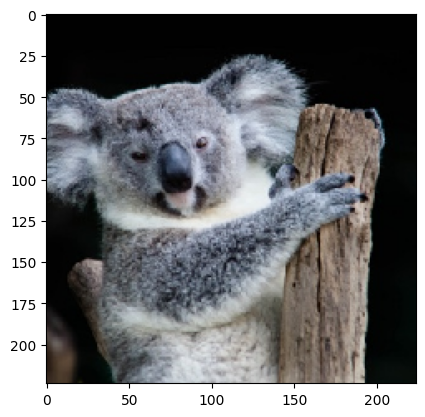

Target image class label: 866 (tractor)


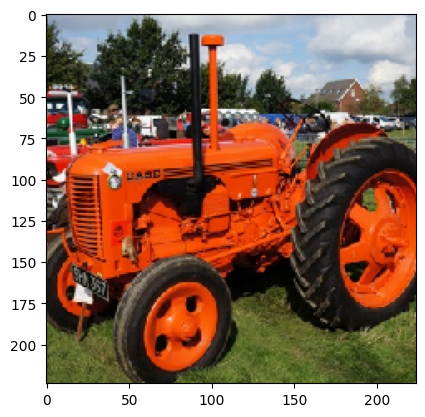

In [65]:
init_class_id = np.argmax(model.predict(np.array([init_image])))
print(f"Init image class label: {init_class_id} ({class_lookup[init_class_id]})")
plt.imshow(init_image.astype(np.uint))
plt.show()

target_class_id = np.argmax(model.predict(np.array([target_image])))
print(f"Target image class label: {target_class_id} ({class_lookup[target_class_id]})")
plt.imshow(target_image.astype(np.uint))
plt.show()

## Implementation av er attack

Beskriv i er rapport vad just er valda attack kallas och i detalj hur den fungerar (sektion 2.2 i rapporten). Beskriv även kort vilka bibliotek ni använder för att implementera den.

## Er kod för attacken

I cellerna nedan lägger ni in er egen kod för att genomföra attacken.

### Bibliotek

In [66]:
# Samla era import statements här e.g.
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd
# ...
import cv2 as cv
import os


### Egna funktioner

In [67]:
# Samla era egna funktioner relaterade till attacken här
# Funktionerna ska kort beskrivas med docstrings och kommentarer så att man förstår syftet och implementationen
# Blir det många bör ni bryta ut dessa i en separat fil


### Förberedelser

### Modellering

In [68]:
# E.g. träning, Använder en generell modell som en wrapper för att kunna använda ART
classifier = KerasClassifier(model=model,clip_values=(0, 255))


### Attack

Attacken är en Boundery Attack, det genereras adverseriella bilder som missklassifierar koala som traktor. Här genereras även två till bilder på fler koalor för att använda vid skyddsmekanismen.

Input image:  images/koala1.jpeg


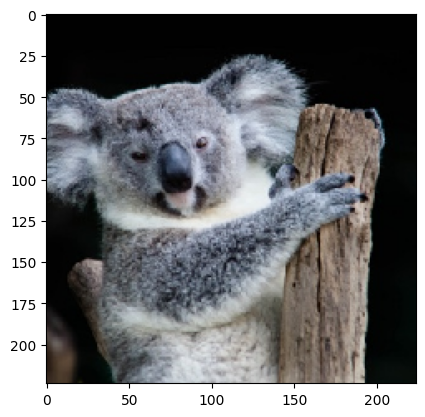

Iteration:  0  L2:  44266.117 Class ID:  105


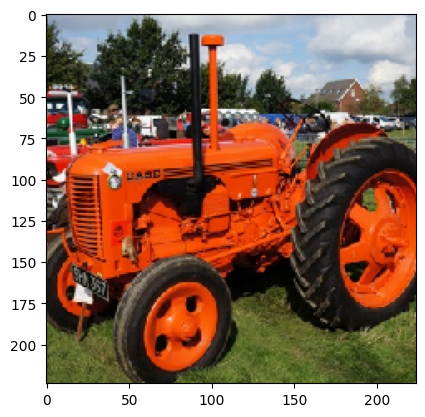

Boundary attack: 100%|██████████| 1/1 [17:03<00:00, 1023.33s/it]

Iteration:  1000  L2:  8408.765 Class ID:  866


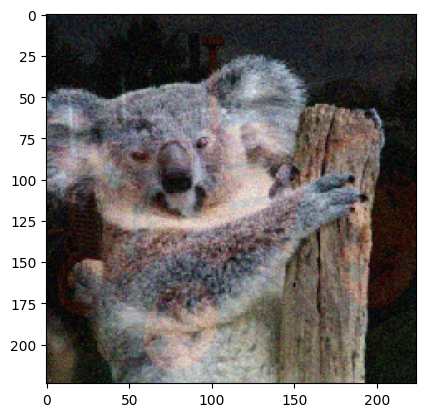

Boundary attack: 100%|██████████| 1/1 [16:46<00:00, 1006.16s/it]

Iteration:  2000  L2:  4950.2974 Class ID:  866


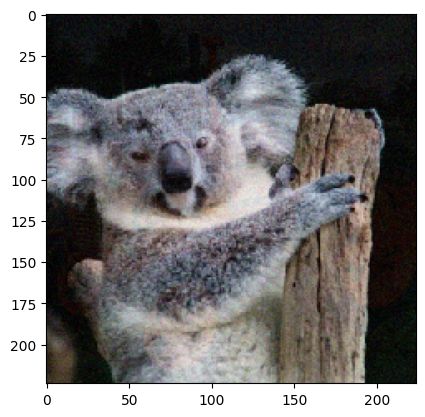

Boundary attack: 100%|██████████| 1/1 [16:24<00:00, 984.51s/it]

Iteration:  3000  L2:  2983.3752 Class ID:  866


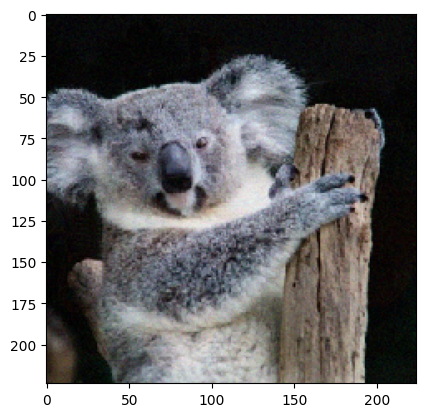

Boundary attack: 100%|██████████| 1/1 [16:18<00:00, 978.79s/it]


Iteration:  4000  L2:  2023.1743 Class ID:  866


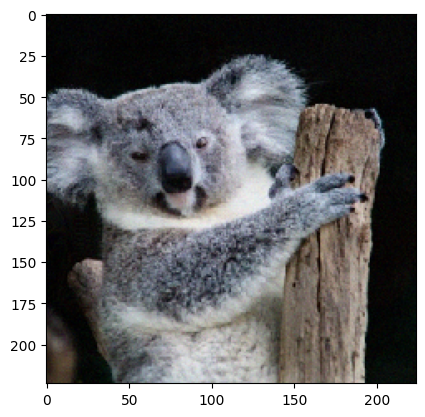

Boundary attack: 100%|██████████| 1/1 [16:27<00:00, 987.60s/it]

Iteration:  5000  L2:  1545.3083 Class ID:  866


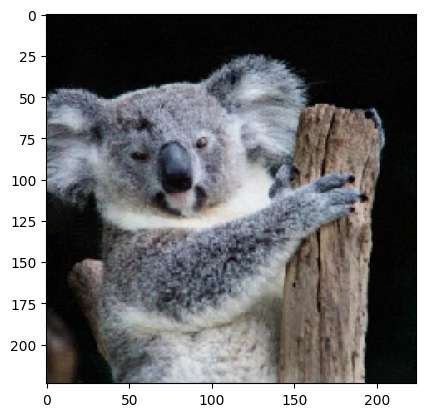

In [ ]:
# Attackutförande
attack = BoundaryAttack(estimator=classifier, targeted=True, max_iter=1000)

#läser in orginalbilden och konverterar den till en array
name = "images/koala1.jpeg"
print("Input image: ", name)
input_image = image.load_img(name, target_size=(224, 224))
input_image = image.img_to_array(input_image)

#Imagenet har 1000 classer enligt https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/
Y = to_categorical([target_class_id], 1000)
x_adv = np.array([target_image])
X = np.array([input_image])

plt.imshow(input_image.astype(np.uint))
plt.show()

#Beräknar euclidisk distans mellan bilderna för att se hur nära vi kan komma orginalbilden andvänds bara visuellt
print("Iteration: ", 0," L2: ",np.linalg.norm(target_image - input_image), "Class ID: ",init_class_id)
plt.imshow(target_image.astype(np.uint))
plt.show()

#Kör 5x1000 iterationer för att kunna följa progressionen av attacken visuellt
for i in range(5):
    x_adv = attack.generate(X, Y,x_adv_init=x_adv)

    init_class_id = np.argmax(model.predict(np.array([x_adv[0]])))
    print("Iteration: ", (i+1)*1000," L2: ",np.linalg.norm(x_adv - input_image), "Class ID: ",init_class_id)
    adv = x_adv[0].astype(np.uint)
    plt.imshow(adv)
    plt.show()

#Spara den adversiala bilden genom att normalisera den och spara den som en png för att inte tappa information
#Sparar även bilden som en numpy array för att kunna använda den i framtida tester och inte tappa någon information alls då det tar lång tid att generera en ny bild
np.save("images/adversial_koala1.npy", x_adv[0])
x_adv_normalized = 255 * (x_adv[0] - np.min(x_adv[0])) / (np.max(x_adv[0]) - np.min(x_adv[0]))
x_adv_normalized = x_adv_normalized.astype(np.uint8)
plt.imsave("images/adversial_koala1.png", x_adv_normalized)


### Attackresultat

Init image class label: 866 (tractor)


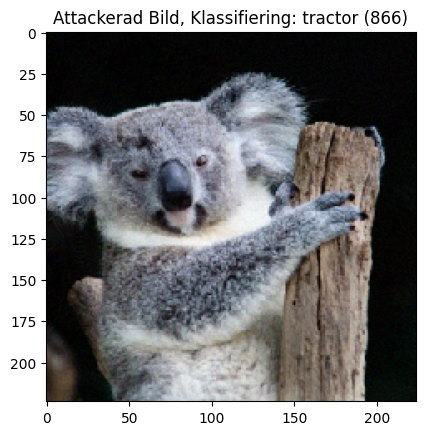

Init image class label: 105 (koala)


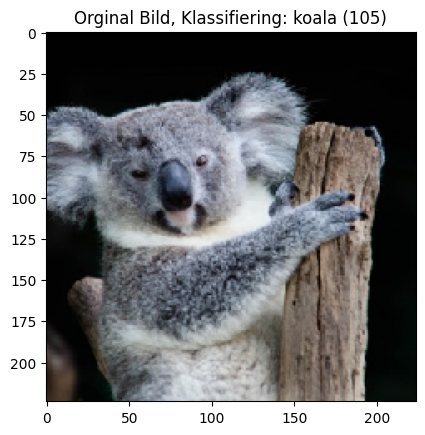

In [ ]:
#Läser in den adversiala bilden och plottar den
adv_image = image.load_img("images/adversial_koala1.png", target_size=(224, 224))
adv_image = image.img_to_array(adv_image)

#Predictar klassen på den adversiala bilden
init_class_id = np.argmax(model.predict(np.array([adv_image])))
print(f"Init image class label: {init_class_id} ({class_lookup[init_class_id]})")
plt.imshow(adv_image.astype(np.uint))
plt.title(f"Attackerad Bild, Klassifiering: {class_lookup[init_class_id]} ({init_class_id})")
plt.show()

#Orginalbild
init_class_id = np.argmax(model.predict(np.array([init_image])))
print(f"Init image class label: {init_class_id} ({class_lookup[init_class_id]})")
plt.imshow(init_image.astype(np.uint))
plt.title(f"Orginal Bild, Klassifiering: {class_lookup[init_class_id]} ({init_class_id})")
plt.show()




## Skyddsåtgärder

Skyddsåtergärden beskrivs under 1.3 i rapporten

## Implementation av skyddsåtgärder (frivilligt endast för A eller B)

### Egna funktioner

In [ ]:
def jpeg_compress(image, quality=95):
    '''Komprimerar en bild med jpeg och returnerar den komprimerade bilden'''
    encode_param = [int(cv.IMWRITE_JPEG_QUALITY), quality]
    _, encimg = cv.imencode('.jpg', image, encode_param)
    decimg = cv.imdecode(encimg, 1)
    return decimg

def predict_compressed(image, show_images=False):
    '''Kollar om en bild är adversarial genom att komprimera den och jämföra med orginalbilden med euclidisk distans'''
    compressed_img = jpeg_compress(image, quality=99)
    if show_images:
        plt.title("Compressed Image")
        plt.imshow(compressed_img.astype(np.uint))
        plt.show()
    return np.argmax(model.predict((np.array([compressed_img]))))

def predict_normal(image, show_images=False):
    '''Förutsäger klassen för en bild med orginalkvalitet'''
    if show_images:
        plt.title("Unmodified Image")
        plt.imshow(image.astype(np.uint))
        plt.show()
    return np.argmax(model.predict((np.array([image]))))

def predict_spacial_smoothing(image, show_images=False):
    '''Förutsäger klassen för en bild med spacial smoothing'''
    smoothen_img = cv.medianBlur(image, 3)
    if show_images:
        plt.title("Spacial Smoothing")
        plt.imshow(smoothen_img.astype(np.uint))
        plt.show()
    return np.argmax(model.predict((np.array([smoothen_img]))))

def safe_predict(model, image, display=False):
    ''''Metod för att förhindra att adversariala bilder används för att förutsäga klasser, vid detektion så avbryts predictionen och -1 retuneras som klass
    samt att en boolean returneras som indikerar om det är en adversarial bild och om den får användas'''
    compressed_pred = predict_compressed(image,display)
    smooth_pred = predict_spacial_smoothing(image,display)
    normal_pred = predict_normal(image,display)
    if display:
        print(f"Compressed: {compressed_pred}, Smooth: {smooth_pred}, Normal: {normal_pred}")
    if compressed_pred == normal_pred == smooth_pred:
        return np.argmax(model.predict((np.array([image])))),True
    else:
        return -1,False



### Förberedelser
Som förberedelser genereras två adverserial bilder till för att kunna styrka och testa skyddsmetodens resultat

Input image:  images/koala2.jpeg


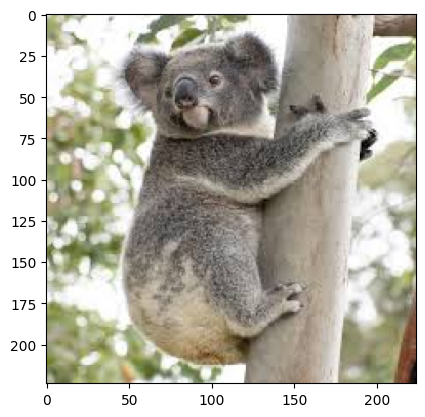

Iteration:  0  L2:  43747.76 Class ID:  105


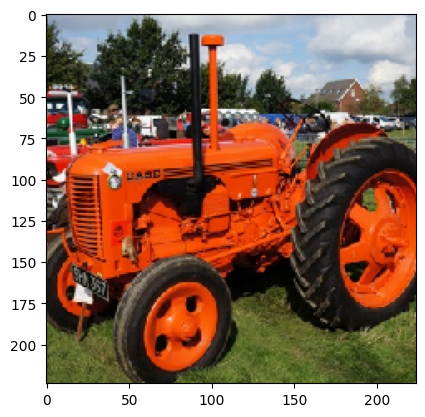

Boundary attack: 100%|██████████| 1/1 [16:28<00:00, 988.37s/it]

Iteration:  1000  L2:  4768.8184 Class ID:  866


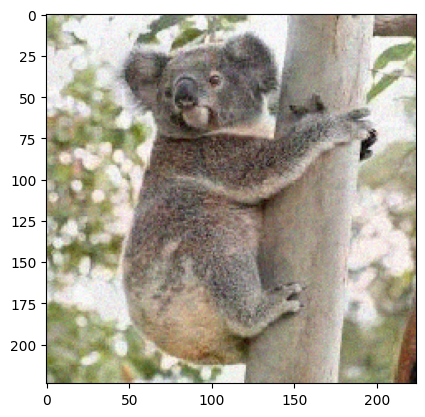

Boundary attack: 100%|██████████| 1/1 [16:16<00:00, 976.79s/it]

Iteration:  2000  L2:  2187.9912 Class ID:  866


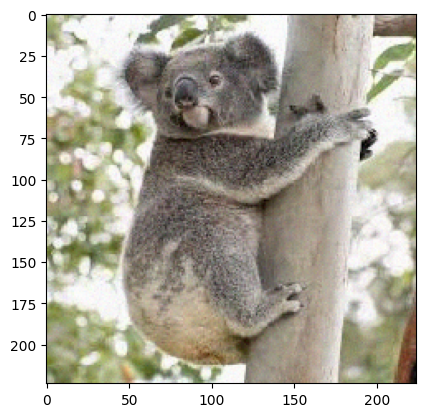

Boundary attack: 100%|██████████| 1/1 [16:52<00:00, 1012.46s/it]


Iteration:  3000  L2:  1424.23 Class ID:  866


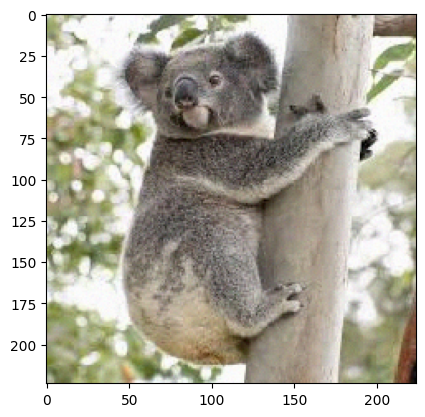

Boundary attack: 100%|██████████| 1/1 [17:15<00:00, 1035.66s/it]

Iteration:  4000  L2:  1079.1104 Class ID:  866


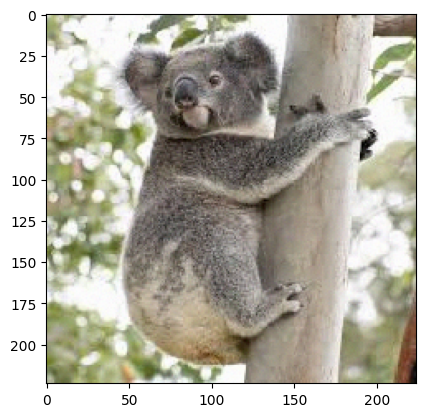

Boundary attack: 100%|██████████| 1/1 [16:24<00:00, 984.22s/it]


Iteration:  5000  L2:  905.09015 Class ID:  866


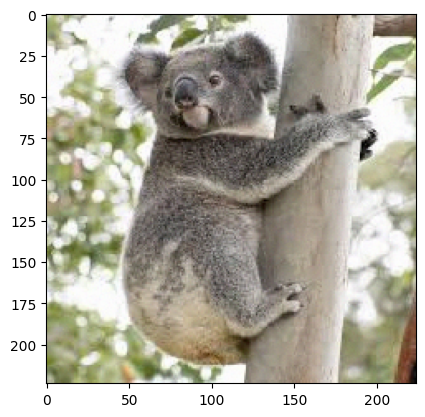

Input image:  images/koala3.jpeg


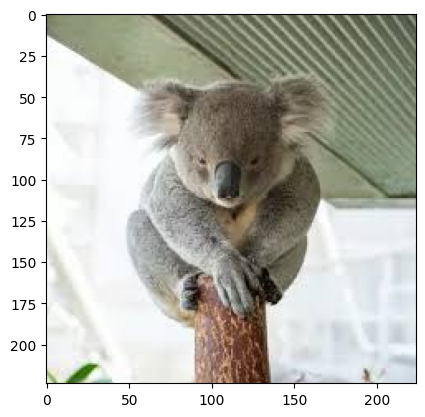

Iteration:  0  L2:  52504.98 Class ID:  866


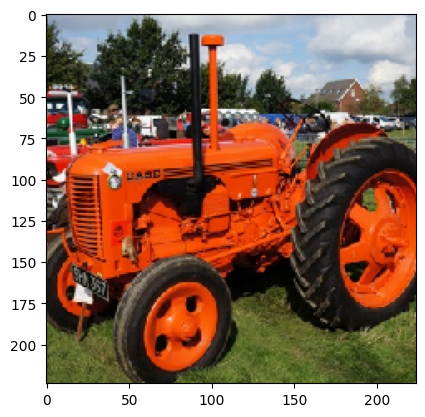

Boundary attack: 100%|██████████| 1/1 [16:27<00:00, 987.28s/it]

Iteration:  1000  L2:  7971.371 Class ID:  866


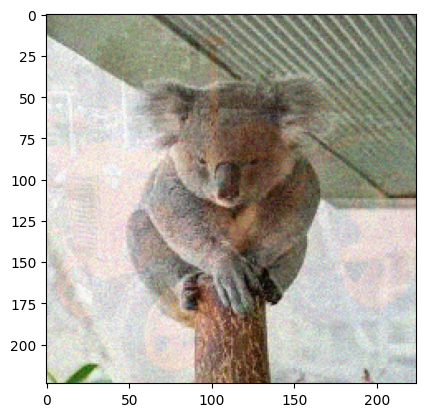

Boundary attack: 100%|██████████| 1/1 [16:25<00:00, 985.05s/it]

Iteration:  2000  L2:  4573.89 Class ID:  866


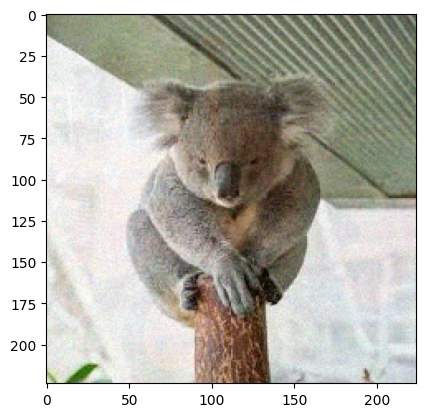

Boundary attack: 100%|██████████| 1/1 [16:20<00:00, 980.94s/it]

Iteration:  3000  L2:  3160.0442 Class ID:  866


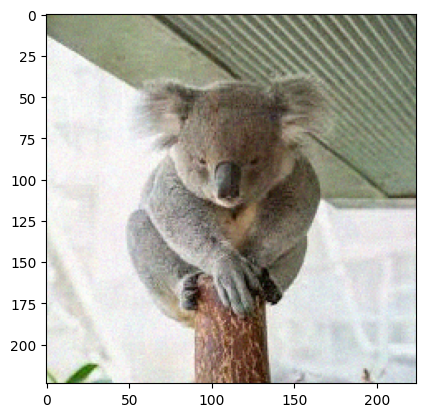

Boundary attack: 100%|██████████| 1/1 [16:17<00:00, 977.23s/it]


Iteration:  4000  L2:  2421.3228 Class ID:  866


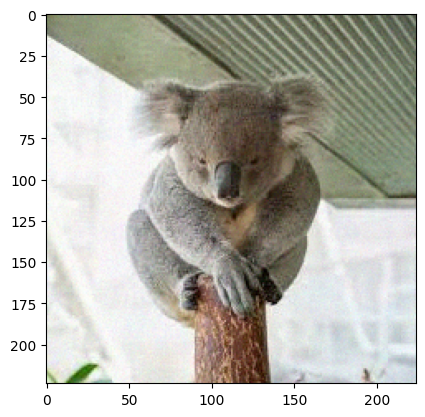

Boundary attack: 100%|██████████| 1/1 [16:12<00:00, 972.02s/it]


Iteration:  5000  L2:  1941.8505 Class ID:  866


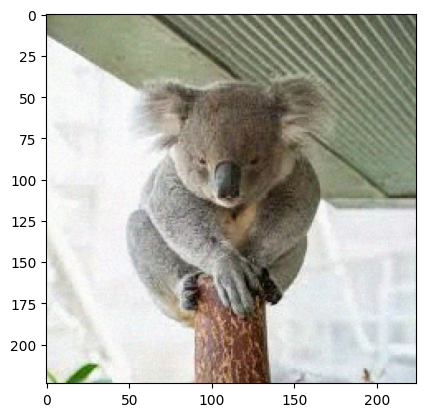

In [ ]:
# Genererar två adversiala bilder till för att testa säkerhetsåtgärden och styrka dess resultat
attack = BoundaryAttack(estimator=classifier, targeted=True, max_iter=1000)

koala_images = []
for index in range(2,4):
    name = "images/koala"+str(index)+".jpeg"
    print("Input image: ", name)
    input_image = image.load_img(name, target_size=(224, 224))
    input_image = image.img_to_array(input_image)

    #Imagenet har 1000 classer enligt https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/
    Y = to_categorical([target_class_id], 1000)
    x_adv = np.array([target_image])
    X = np.array([input_image])

    plt.imshow(input_image.astype(np.uint))
    plt.show()

    #Beräknar euclidisk distans mellan bilderna för att se hur nära vi kan komma orginalbilden
    print("Iteration: ", 0," L2: ",np.linalg.norm(target_image - input_image), "Class ID: ",init_class_id)
    plt.imshow(target_image.astype(np.uint))
    plt.show()

    #Kör 10 iterationer för att kunna plotta progressionen av attacken visuellt
    for i in range(5):
        x_adv = attack.generate(X, Y,x_adv_init=x_adv)

        init_class_id = np.argmax(model.predict(np.array([x_adv[0]])))
        print("Iteration: ", (i+1)*1000," L2: ",np.linalg.norm(x_adv - input_image), "Class ID: ",init_class_id)
        adv = x_adv[0].astype(np.uint)
        plt.imshow(adv)
        plt.show()

    #Spara den adversiala bilden genom att normalisera den och spara den som en png för att inte tappa information
    #Sparar även bilden som en numpy array för att kunna använda den i framtida tester och inte tappa någon information alls då det tar lång tid att generera en ny bild
    np.save("images/adversial_koala"+str(index)+".npy", x_adv[0])
    x_adv_normalized = 255 * (x_adv[0] - np.min(x_adv[0])) / (np.max(x_adv[0]) - np.min(x_adv[0]))
    x_adv_normalized = x_adv_normalized.astype(np.uint8)
    plt.imsave("images/adversial_koala"+str(index)+".png", x_adv_normalized)


### Skydd

Skyddsåtergärden är beskriven under 1.3 i rapporten

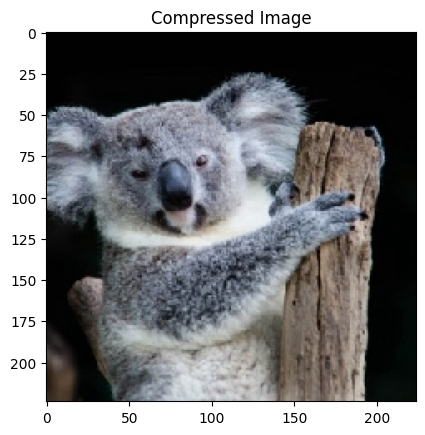

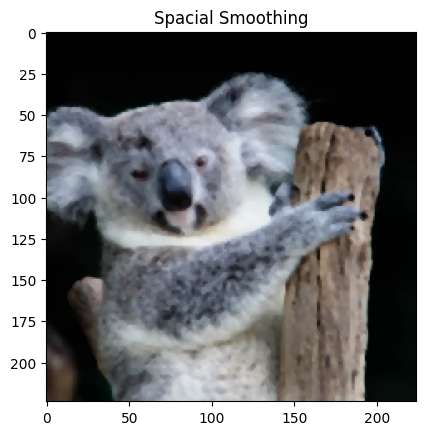

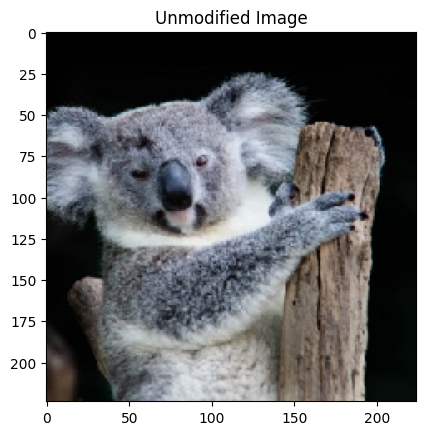

Compressed: 105, Smooth: 105, Normal: 105
Result from defence mechanic, Clean Image:  (105, True)


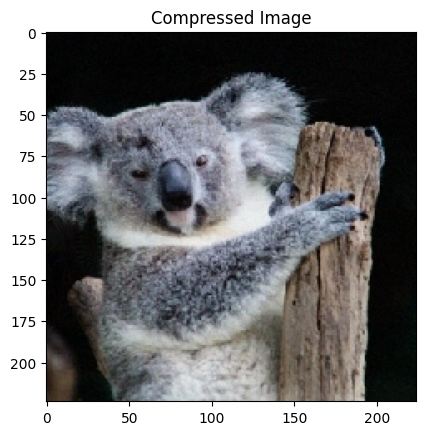

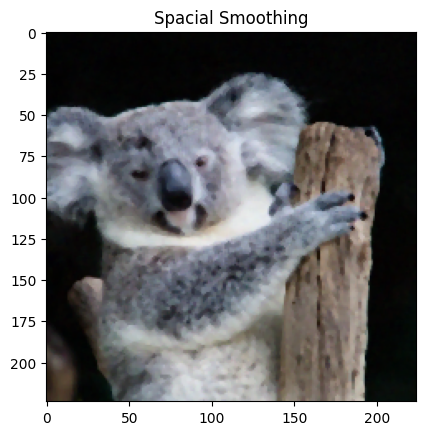

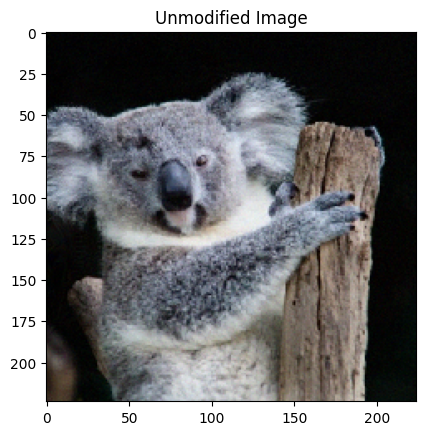

Compressed: 105, Smooth: 105, Normal: 866
Result from defence mechanic, Attacked Image:  (-1, False)


In [132]:
# Implementation av skyddsåtgärd
#Testar att köra safe_predict på ren bild
clean_image = image.load_img("images/koala1.jpeg", target_size=(224, 224))
clean_image = image.img_to_array(clean_image)
print("Result from defence mechanic, Clean Image: ", safe_predict(model, clean_image,True))

#Testar att köra safe_predict på adversarial bild
adv_image = np.load("images/adversial_koala1.npy")
print("Result from defence mechanic, Attacked Image: ", safe_predict(model, adv_image,True))

### Skyddsresultat

Resultatet presenteras i 1.4 i rapporten

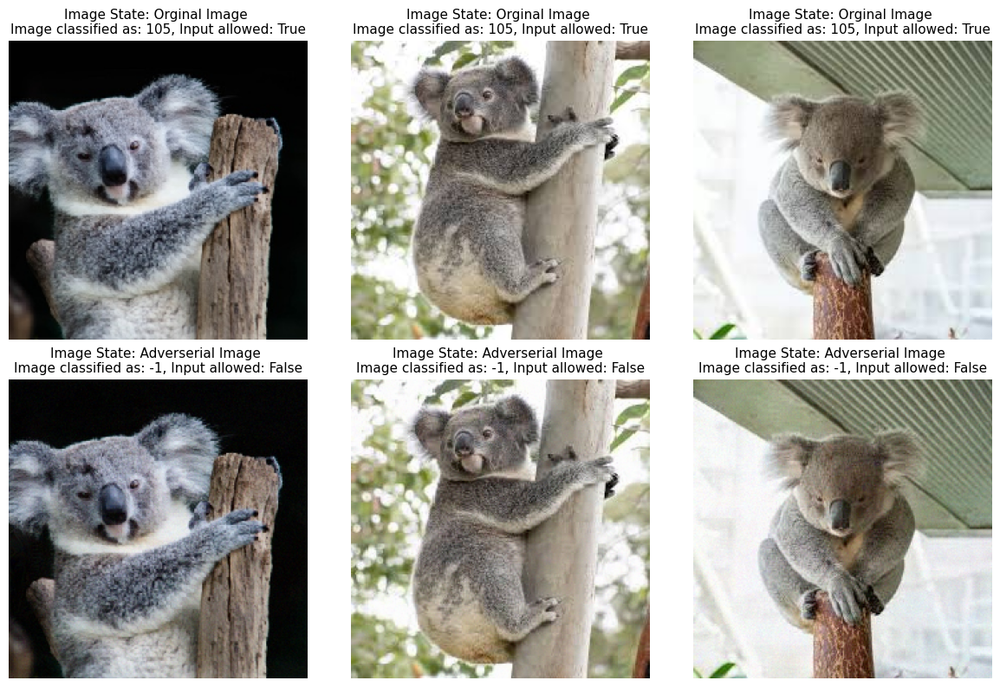

In [ ]:
array_of_images = []
for index in range(1,4):
    tmp_image = image.load_img("images/koala"+str(index)+".jpeg", target_size=(224, 224))
    tmp_image = image.img_to_array(tmp_image)
    array_of_images.append(tmp_image)

for index in range(1,4):
    tmp_image = np.load("images/adversial_koala"+str(index)+".npy")
    array_of_images.append(tmp_image)

fig, axs = plt.subplots(2, 3, figsize=(12, 8))

# loopa över alla bilder och plotta dem
for i, ax in enumerate(axs.flat):

    # Skriv ut om bilden är orginal eller adverserial
    if i < 3:
        attacked = "Orginal Image"
    else:
        attacked = "Adverserial Image"

    #Kör bilden genom adverseriell detektion
    pred_class,img_allowed = safe_predict(model,array_of_images[i])

    ax.imshow(array_of_images[i].astype(np.uint))
    ax.set_title(f"Image State: {attacked} \nImage classified as: {pred_class}, Input allowed: "+str(img_allowed), fontsize=11)
    ax.axis("off")

# Visa plotten
fig.tight_layout()
plt.show()


# Referenser

Attackmetod: https://arxiv.org/pdf/1712.04248  
Bibliotek för attack: https://adversarial-robustness-toolbox.readthedocs.io/en/latest/modules/attacks/evasion.html  
Källa för försvar: https://arxiv.org/abs/1704.01155